# Traveling salesman problem

Import util functions

In [1]:
from tsp import *
import time

In [3]:
run_experiment(exp_id='default', data_input='inputs/tsp_std.in', repeats=10, mut_max_len=10, mut_prob=0.2, cx_prob=0.8, max_gen=5000, pop_size=100, fitness=fitness,  create_ind=create_random_perm, cross=order_cross, mutate=swap_mutate,  print_frequency=10)
plot_experiments('default')

0 379704.68 309358.15 246936.77
  432000 378671.77 304771.97 246936.77
  433000 370449.78 308037.98 246936.77
  434000 403369.85 299915.12 245326.46
  435000 370146.43 306072.09 245326.46
  436000 391541.72 308647.80 245297.96
  437000 409435.94 331486.62 240779.16
  438000 429257.27 333237.01 240779.16
  439000 415014.47 317897.63 240779.16
  440000 357966.80 297709.22 240779.16
  441000 384955.02 298739.47 238073.47
  442000 385994.77 306015.16 238073.47
  443000 373952.12 298116.74 238073.47
  444000 356474.44 299838.77 238073.47
  445000 338822.49 289656.08 235590.73
  446000 355720.36 285535.73 235590.73
  447000 342496.04 280913.16 235590.73
  448000 366640.54 293216.37 235590.73
  449000 355445.00 279332.81 235590.73
  450000 383843.62 295411.89 235590.73
  451000 362123.28 290643.45 235590.73
  452000 433630.66 328677.42 235590.73
  453000 404319.20 340276.69 235590.73
  454000 420921.43 315753.24 235590.73
  455000 375844.78 303681.01 235590.73
  456000 369505.51 307761.59 235

KeyboardInterrupt: 

### Edge recombination

  100000 332183.88 288591.87 279902.33
  200000 327346.60 267767.31 250951.73
  300000 320965.64 244978.38 238729.99
  400000 280102.10 236862.70 221963.40
  500000 294249.25 231441.99 215038.27
  100000 305631.20 261126.03 253033.42
  200000 313825.16 233678.79 219088.40
  300000 259104.86 220485.55 215923.20
  400000 274685.08 208220.76 202978.87
  500000 242486.80 207499.29 201168.97
  100000 324143.07 273656.26 264795.31
  200000 277575.77 233010.89 227085.23
  300000 253725.60 220556.61 214671.62
  400000 253479.50 207646.91 200208.79
  500000 245541.45 198741.04 190855.39
  100000 310702.07 261152.42 254458.53
  200000 247909.35 214444.96 208369.20
  300000 251310.66 213029.67 203708.58
  400000 255590.32 213523.82 201641.41
  500000 243164.67 210212.32 201514.65
  100000 300520.90 258104.93 249160.29
  200000 238325.64 204483.29 198106.52
  300000 220561.63 183916.65 178589.85
  400000 244351.97 178856.75 171780.68
  500000 255172.25 182372.52 170871.13
  100000 298146.56 253270

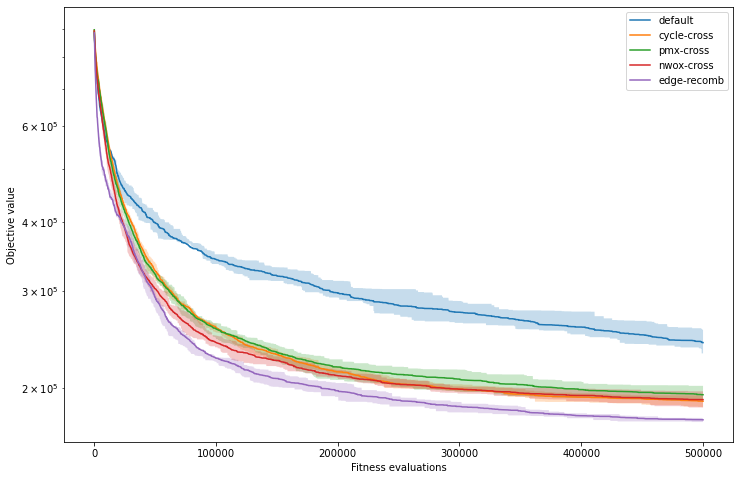

In [8]:
run_experiment(exp_id='pmx-cross', data_input='inputs/tsp_std.in', repeats=10, mut_max_len=10, mut_prob=0.2, cx_prob=0.8, max_gen=5000, pop_size=100, fitness=fitness,  create_ind=create_random_perm, cross=pmx_cross, mutate=swap_mutate,  print_frequency=1000)
run_experiment(exp_id='edge-recomb', data_input='inputs/tsp_std.in', repeats=10, mut_max_len=10, mut_prob=0.2, cx_prob=0.8, max_gen=5000, pop_size=100, fitness=fitness,  create_ind=create_random_perm, cross=edge_recomb_cross, mutate=swap_mutate,  print_frequency=1000)
run_experiment(exp_id='nwox-cross', data_input='inputs/tsp_std.in', repeats=10, mut_max_len=10, mut_prob=0.2, cx_prob=0.8, max_gen=5000, pop_size=100, fitness=fitness,  create_ind=create_random_perm, cross=nwox_cross, mutate=swap_mutate,  print_frequency=1000)
run_experiment(exp_id='cycle-cross', data_input='inputs/tsp_std.in', repeats=10, mut_max_len=10, mut_prob=0.2, cx_prob=0.8, max_gen=5000, pop_size=100, fitness=fitness,  create_ind=create_random_perm, cross=cycle_cross, mutate=swap_mutate,  print_frequency=1000)

plot_experiments('default', 'cycle-cross', 'pmx-cross', 'nwox-cross', 'edge-recomb')


Edge recombination gives best performance, but it runs approximately **10x** slower than other crossovers.

## Effect of population size on performance
We see that our experiments didn't have enough generations to converge. From now on, I will repeat each experiment only once, trading confidence for running time.
We will investigate the effect of population size on performance.


In [9]:
import time
for p in [50, 100, 200, 400, 800]:
    start = time.time()
    run_experiment(exp_id=f"nwox-pop-size={p}", data_input='inputs/tsp_std.in', repeats=10, mut_max_len=10, mut_prob=0.2, cx_prob=0.8, max_gen=8000, pop_size=p, fitness=fitness,  create_ind=create_random_perm, cross=nwox_cross, mutate=swap_mutate,  print_frequency=500, parallel=True)

    print(f"Pop-size={p} took {time.time() - start} sec")


c
  100000 358417.31 309040.08 294575.86
  200000 269067.52 236187.91 231469.61
  300000 288070.82 227898.36 221581.90
  400000 262810.04 215548.88 206955.65
  500000 230695.58 196856.19 190281.03
  600000 236964.07 191975.78 187798.09
  700000 240199.69 194013.80 187501.18
  800000 247447.29 193772.53 187501.18
  900000 247072.45 195567.99 187501.18
 1000000 223453.16 193561.26 187501.18
 1100000 248109.73 195230.32 187501.18
 1200000 238292.15 192848.49 187501.18
 1300000 249629.66 194103.55 187501.18
 1400000 240894.17 194664.08 187284.57
 1500000 236997.45 192663.30 187284.57
 1600000 259628.70 198159.59 187284.57
  100000 334229.82 300578.09 288349.21
  200000 270002.25 231264.08 218278.72
  300000 257752.68 209360.79 204205.43
  400000 228796.24 195358.95 190114.95
  500000 228388.17 188461.49 181756.12
  600000 225028.21 183834.77 179752.65
  700000 234526.94 184836.97 179464.62
  800000 240649.50 185062.91 179341.00
  900000 223713.77 182975.55 177100.89
 1000000 236949.25 1821

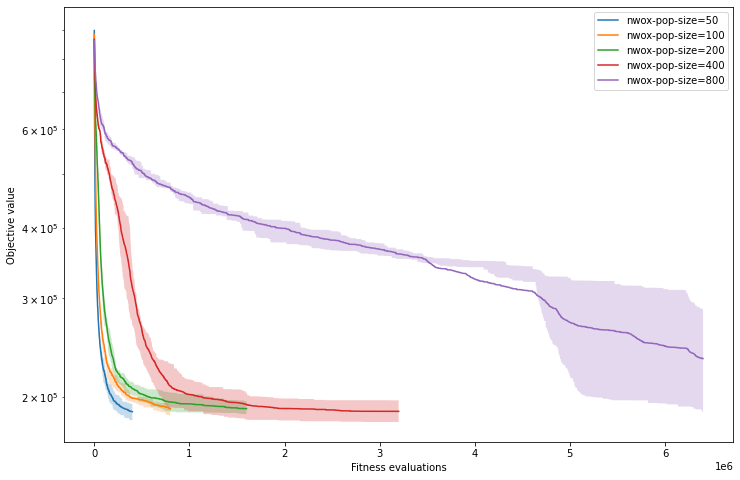

In [10]:
plot_experiments(*[f'nwox-pop-size={p}' for p in [50, 100, 200, 400, 800]])
    

Larger populations have more diversity, so maybe they take longer to converge. Too small population and GA will converge prematurely, too large and it will fail to converge in reasonable time. For our purposes `pop_size=200` is probably enough.

## Increasing pop_size for other crossovers
Previous experiment compared the effect of population size when using NWOX. Let's see how bigger population size affects other crossovers

  400000 497270.15 411460.02 331861.67
  800000 479166.87 381649.07 276364.96
  400000 617335.30 506584.92 361797.25
  800000 572643.24 456023.57 307562.06
  400000 529024.96 420055.80 320369.81
  800000 461301.65 369024.29 268719.10
  400000 571281.48 471596.69 349712.13
  800000 531964.63 433880.47 303620.28
  400000 538725.95 465378.10 342792.82
  800000 536501.16 437737.84 319912.95
  400000 556349.46 453598.80 346887.05
  800000 517385.13 420529.54 297183.43
  400000 545648.67 454700.39 365892.76
  800000 528908.71 433831.98 312360.59
  400000 532248.25 431183.96 341734.92
  800000 529345.69 418569.83 304493.77
  400000 598329.32 463030.74 350221.52
  800000 535261.96 425964.87 312882.41
  400000 578802.60 439316.80 337206.05
  800000 503464.08 407532.83 290750.66
Run 0: difference = 262485.4927176626
Run 1: difference = 275257.22109282896
Run 2: difference = 256157.27929420013
Run 3: difference = 291406.17168176814
Run 4: difference = 298283.8429581716
Run 5: difference = 281538.

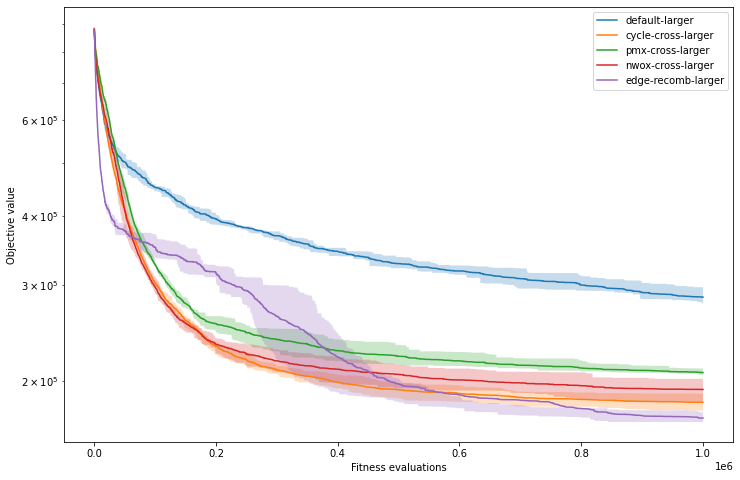

In [7]:

def run_larger(exp_name, cross):
    start = time.time()

    run_experiment(exp_id=exp_name, data_input='inputs/tsp_std.in', repeats=10, mut_max_len=10, mut_prob=0.2, cx_prob=0.8, max_gen=5000, pop_size=200, fitness=fitness,  create_ind=create_random_perm, cross=cross, mutate=swap_mutate,  print_frequency=2000, parallel=True)

    print(f"{exp_name} took {time.time() - start} sec")
    
run_larger("default-larger", order_cross)
run_larger("cycle-cross-larger", cycle_cross)
run_larger("pmx-cross-larger", pmx_cross)
run_larger("nwox-cross-larger", nwox_cross)
run_larger("edge-recomb-larger", edge_recomb_cross)

plot_experiments('default-larger', 'cycle-cross-larger', 'pmx-cross-larger', 'nwox-cross-larger', 'edge-recomb-larger')


Edge recombination looks to be much less stable at `pop, while the NWOX, PMX and Cycle-Crossover keep getting better with more generations. It might just be that larger population is needed for PMX/NWOX,CycleCX to shine. Let's see how these different crossovers play with different kinds of mutations.

## Better mutation 

 7: difference = 198510.99655862126
Run 8: difference = 205123.72680958573
Run 9: difference = 204047.37445581282
   10000 672672.90 608665.89 556638.59
   20000 638812.64 554043.62 483423.33
   30000 623084.91 543595.07 469274.11
   40000 565674.39 511753.42 455424.63
   50000 605210.45 509018.87 439565.41
   60000 558346.80 468472.45 407389.58
   70000 532545.27 458159.14 387021.37
   80000 474156.37 412036.23 355747.30
   90000 517030.12 420518.25 336800.91
  100000 454119.93 390445.72 326649.08
  110000 433597.78 360362.88 317229.92
  120000 462995.99 384891.04 310939.57
  130000 422236.18 351155.94 303446.95
  140000 491411.83 416849.19 303446.95
  150000 486018.36 387746.07 303446.95
  160000 404565.04 329542.28 298774.20
  170000 397638.01 335470.80 287927.31
  180000 416727.19 351297.17 284999.13
  190000 433215.38 366473.95 284530.97
  200000 398089.09 327023.62 273819.13
  210000 408068.45 326701.37 273126.97
  220000 457905.33 342741.99 271709.39
  230000 390751.07 324059.32

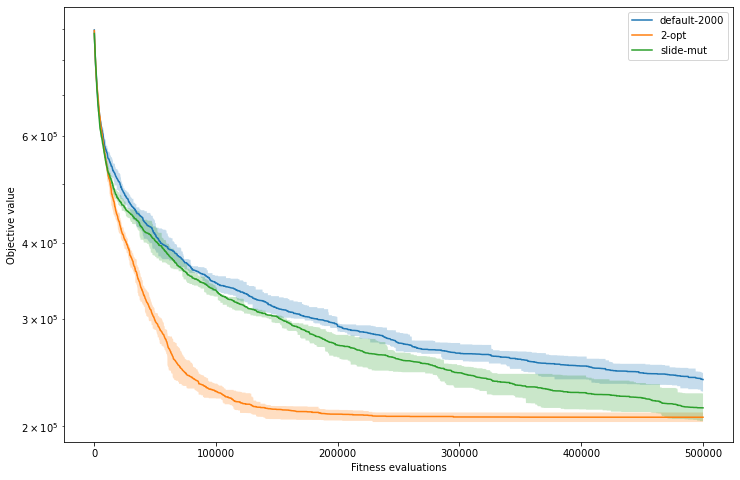

In [10]:
run_experiment(exp_id='default-2000', data_input='inputs/tsp_std.in', repeats=10, mut_max_len=10, mut_prob=0.2, cx_prob=0.8, max_gen=5000, pop_size=100, fitness=fitness,  create_ind=create_random_perm, cross=order_cross, mutate=swap_mutate,  print_frequency=100)
run_experiment(exp_id='2-opt', data_input='inputs/tsp_std.in', repeats=10, mut_max_len=10, mut_prob=0.2, cx_prob=0.8, max_gen=5000, pop_size=100, fitness=fitness,  create_ind=create_random_perm, cross=order_cross, mutate=two_opt_mut,  print_frequency=100)
run_experiment(exp_id='slide-mut', data_input='inputs/tsp_std.in', repeats=10, mut_max_len=10, mut_prob=0.2, cx_prob=0.8, max_gen=5000, pop_size=100, fitness=fitness,  create_ind=create_random_perm, cross=order_cross, mutate=slide_mut,  print_frequency=100)

plot_experiments('default-2000', '2-opt', 'slide-mut')

In [ ]:
2-OPT looks to be significantly better than slide and swap mutation.

## Xovers with 2opt - TODO

In [10]:
import time
def run_std(exp_name, cross, mutate, pop_size=100, max_gen=2500, repeats=1):
    start = time.time()

    run_experiment(exp_id=exp_name, data_input='inputs/tsp_std.in', repeats=repeats, mut_max_len=10, mut_prob=0.2, cx_prob=0.8, max_gen=max_gen, pop_size=pop_size, fitness=fitness,  create_ind=create_random_perm, cross=cross, mutate=mutate,  print_frequency=2000, parallel=True)

    print(f"{exp_name} took {time.time() - start} sec")
    
run_std("default-2opt", order_cross, two_opt_mut)
run_std("cycle-cross-2opt", cycle_cross, two_opt_mut)
run_std("pmx-cross-2opt", pmx_cross, two_opt_mut)
run_std("nwox-cross-2opt", nwox_cross, two_opt_mut)
run_std("edge-recomb-2opt", edge_recomb_cross, two_opt_mut)

plot_experiments('default-2opt', 'cycle-cross-2opt', 'pmx-cross-2opt', 'nwox-cross-2opt', 'edge-recomb-2opt')

Process ForkPoolWorker-8:
Process ForkPoolWorker-5:
Process ForkPoolWorker-4:
Process ForkPoolWorker-3:
Process ForkPoolWorker-1:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/usr/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/usr/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/usr/lib/python3.9/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.9/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
Process ForkPoolWorker-2:
  File "/usr/lib/python3.9/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/usr/lib/python3.9/multiprocessing/process.py", line 108, in run
    self._target(*

KeyboardInterrupt: 

## 

## Combining various mutations and crossovers


Different operators may be effective at different population sizes. The optimal crossover and mutation operator may depend on specific parameter choice, so maybe we can make them work together by defining hybrid mutation and crossover operators
- `hybridCrossoverRandom` - chooses random crossover from specified set of crossovers
- `hybridCrossoverBest` - chooses crossover, which gives the best offspring

similarly with the mutation...



In [13]:
# edge_recomb_cross is not included, because it is so slow and basically on par in performance with cycle_cross

locations = read_locations("inputs/tsp_std.in")
globals()['cities'] = locations

# Candidate best solution
run_experiment(exp_id='edge-recomb-2opt', data_input='inputs/tsp_std.in', repeats=10, mut_max_len=10, mut_prob=0.2, cx_prob=0.8, max_gen=5000, pop_size=100, fitness=fitness,  create_ind=create_random_perm, cross=edge_recomb_cross, mutate=two_opt_mut,  print_frequency=1000)


run_experiment(exp_id='hybrid-cross-random', data_input='inputs/tsp_std.in', repeats=10, mut_max_len=10, mut_prob=0.2, cx_prob=0.8, max_gen=5000, pop_size=100, fitness=fitness,  create_ind=create_random_perm, cross=hybridCrossoverRandom(cross_set=cross_set, weights=[1, 1, 1, 1]), mutate=swap_mutate,  print_frequency=1000)

run_experiment(exp_id='hybrid-cross-best', data_input='inputs/tsp_std.in', repeats=10, mut_max_len=10, mut_prob=0.2, cx_prob=0.8, max_gen=5000, pop_size=100, fitness=fitness,  create_ind=create_random_perm, cross=hybridCrossoverBest(cross_set=cross_set), mutate=swap_mutate,  print_frequency=1000)

run_experiment(exp_id='hybrid-mutation-random', data_input='inputs/tsp_std.in', repeats=10, mut_max_len=10, mut_prob=0.2, cx_prob=0.8, max_gen=5000, pop_size=100, fitness=fitness,  create_ind=create_random_perm, cross=order_cross, mutate=hybridMutationRandom(mutate_set=mutate_set, weights=[1, 1]),  print_frequency=1000)

run_experiment(exp_id='hybrid-mutation-best', data_input='inputs/tsp_std.in', repeats=10, mut_max_len=10, mut_prob=0.2, cx_prob=0.8, max_gen=5000, pop_size=100, fitness=fitness,  create_ind=create_random_perm, cross=order_cross, mutate=hybridMutationBest(mutate_set=mutate_set),  print_frequency=1000)

run_experiment(exp_id='hybrid-best-mutation-and-cross', data_input='inputs/tsp_std.in', repeats=10, mut_max_len=10, mut_prob=0.2, cx_prob=0.8, max_gen=5000, pop_size=100, fitness=fitness,  create_ind=create_random_perm, cross=hybridCrossoverBest(cross_set=cross_set), mutate=hybridMutationBest(mutate_set=mutate_set), print_frequency=100)

run_experiment(exp_id='hybrid-random-cross-and-mutation', data_input='inputs/tsp_std.in', repeats=10, mut_max_len=10, mut_prob=0.2, cx_prob=0.8, max_gen=5000, pop_size=1000, fitness=fitness,  create_ind=create_random_perm, cross=hybridCrossoverRandom(cross_set=cross_set, weights=[1, 1, 1, 1]), mutate=hybridMutationRandom(mutate_set=mutate_set, weights=[1, 1]),  print_frequency=100)






 = 176352.03880484577
Run 8: difference = 177805.90676452432
Run 9: difference = 184412.27933017176
  100000 972679.84 822704.09 637164.43
  200000 998112.48 824507.75 619322.48
  300000 885035.70 656046.83 534591.41
  400000 812286.86 562224.82 419746.02
  500000 704738.63 509319.38 404622.51
  600000 749590.08 493137.04 377507.75
  700000 789721.86 490776.62 377038.05
  800000 642032.96 465599.54 356813.66
  900000 716232.87 496931.20 351099.54
 1000000 589644.60 442652.65 350258.66
 1100000 610725.34 424799.02 329857.65
 1200000 689634.08 445004.28 319797.52
 1300000 586133.72 384666.65 302174.82
 1400000 596715.35 403363.53 290418.13
 1500000 587323.34 398281.15 286012.93
 1600000 600139.41 345361.09 276239.41
 1700000 375738.68 265747.33 230757.27
 1800000 320463.02 227267.35 207542.35
 1900000 243950.39 193428.84 185645.31
 2000000 245845.91 178892.30 171310.47
 2100000 225224.17 173973.73 170813.64
 2200000 232575.21 172190.79 169266.69
 2300000 252005.63 175301.15 166135.03
 24

No handles with labels found to put in legend.
Cannot plot  edge-recomb
Cannot plot  hybrid-cross-best
Cannot plot  hybrid-best-mutation-and-cross


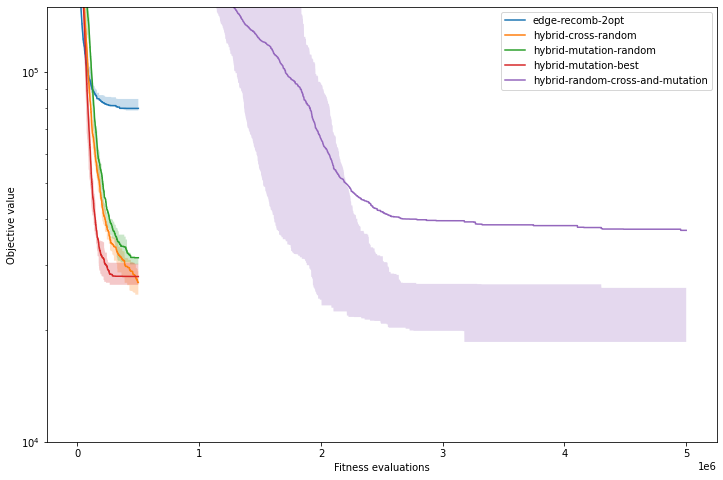

In [20]:
tsp.plot_experiments('edge-recomb', 'edge-recomb-2opt', 'hybrid-cross-random', 'hybrid-cross-best', 'hybrid-mutation-random', 'hybrid-mutation-best', 'hybrid-best-mutation-and-cross', 'hybrid-random-cross-and-mutation')

In [18]:
run_experiment(exp_id='hybrid-cross-best-mut-60', data_input='inputs/tsp_std.in', repeats=5, mut_max_len=10, mut_prob=0.6, cx_prob=0.8, max_gen=2500, pop_size=200, fitness=fitness,  create_ind=create_random_perm, cross=hybridCrossoverBest(cross_set=cross_set), mutate=swap_mutate,  print_frequency=100)

run_experiment(exp_id='hybrid-cross-best-mut-10', data_input='inputs/tsp_std.in', repeats=5, mut_max_len=10, mut_prob=0.1, cx_prob=0.8, max_gen=2500, pop_size=200, fitness=fitness,  create_ind=create_random_perm, cross=hybridCrossoverBest(cross_set=cross_set), mutate=swap_mutate,  print_frequency=100)

run_experiment(exp_id='hybrid-cross-best-mut-35', data_input='inputs/tsp_std.in', repeats=5, mut_max_len=10, mut_prob=0.35, cx_prob=0.8, max_gen=2500, pop_size=200, fitness=fitness,  create_ind=create_random_perm, cross=hybridCrossoverBest(cross_set=cross_set), mutate=swap_mutate,  print_frequency=100)

run_experiment(exp_id='hybrid-cross-best-mut-5', data_input='inputs/tsp_std.in', repeats=5, mut_max_len=10, mut_prob=0.05, cx_prob=0.8, max_gen=2500, pop_size=200, fitness=fitness,  create_ind=create_random_perm, cross=hybridCrossoverBest(cross_set=cross_set), mutate=swap_mutate,  print_frequency=100)

run_experiment(exp_id='hybrid-cross-best-mut-2', data_input='inputs/tsp_std.in', repeats=5, mut_max_len=10, mut_prob=0.02, cx_prob=0.8, max_gen=2500, pop_size=200, fitness=fitness,  create_ind=create_random_perm, cross=hybridCrossoverBest(cross_set=cross_set), mutate=swap_mutate,  print_frequency=100)



  160000 221820.60 188082.26 186431.65
  180000 216409.88 182700.85 180989.79
  200000 217373.25 182817.12 180647.20
  220000 220188.19 182928.14 180647.20
  240000 215477.14 182214.30 178920.80
  260000 214438.78 179895.33 177872.15
  280000 211281.06 178919.75 176536.14
  300000 212516.45 178967.56 176536.14
  320000 211469.95 177552.70 174955.77
  340000 211197.58 177465.88 174955.77
  360000 211248.96 176236.59 174592.43
  380000 212784.23 176389.82 174003.82
  400000 208222.82 177024.56 173805.69
  420000 226295.88 175013.15 172826.77
  440000 212517.95 175585.97 172826.77
  460000 206421.40 175336.09 172826.77
  480000 206432.27 174548.31 172826.77
  500000 206045.28 174557.38 172653.89
   20000 341509.67 297864.20 290449.82
   40000 276208.99 246986.31 245079.14
   60000 256209.70 222004.61 219752.97
   80000 241499.52 206750.03 204945.50
  100000 229983.90 204532.10 202895.93
  120000 231769.81 197819.70 194913.91
  140000 229680.56 193402.29 190855.14
  160000 220945.22 18465

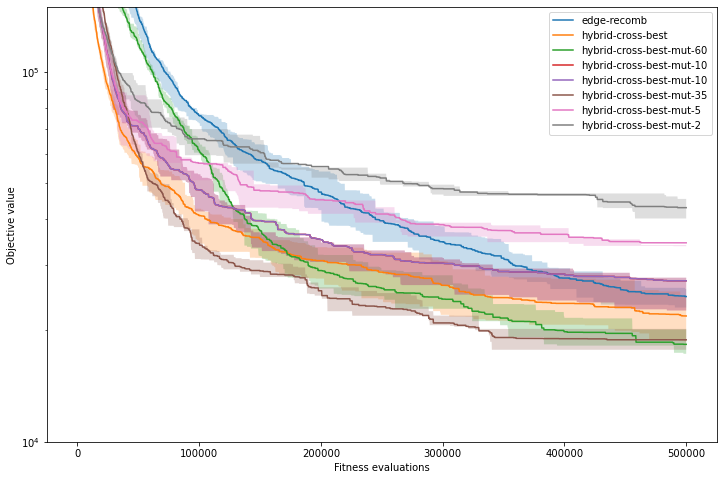

In [40]:
tsp.plot_experiments('edge-recomb', 'hybrid-cross-best', 'hybrid-cross-best-mut-60', 'hybrid-cross-best-mut-10', 'hybrid-cross-best-mut-10', 'hybrid-cross-best-mut-35', 'hybrid-cross-best-mut-5', 'hybrid-cross-best-mut-2')

It looks like more mutation is better.



In [ ]:
run_experiment(exp_id='hybrid-best-mutation-and-cross-pop-1000', data_input='inputs/tsp_std.in', repeats=1, mut_max_len=10, mut_prob=0.2, cx_prob=0.8, max_gen=5000, pop_size=1000, fitness=fitness,  create_ind=create_random_perm, cross=hybridCrossoverBest(cross_set=cross_set), mutate=hybridMutationBest(mutate_set=mutate_set), print_frequency=100)


## Initialization
### Nearest neighbour heuristic

In [10]:
cities = read_locations("inputs/tsp_std.in")


    
    

In [116]:
run_experiment(exp_id='nn-init', data_input='inputs/tsp_std.in', repeats=10, mut_max_len=10, mut_prob=0.2, cx_prob=0.4, max_gen=5000, pop_size=100, fitness=fitness,  create_ind=generate_path_nn, cross=cycle_cross, mutate=hybridMutationRandom(mutate_set=[two_opt_mut, slide_mut, swap_mutate], weights=[1, 1, 1]),  print_frequency=500)

   50000 312546.01 278072.90 274437.20
  100000 269837.73 233533.37 231051.74
  150000 246494.67 211484.56 208290.29
  200000 226309.38 199783.48 194166.21
  250000 221764.69 193532.34 190039.16
  300000 217787.45 188512.54 186163.33
  350000 218555.95 185184.14 181487.44
  400000 215859.44 186969.04 180038.69
  450000 204541.75 179854.41 178129.88
  500000 211660.35 179904.45 176802.09
   50000 324839.76 295142.83 289989.99
  100000 254612.88 228410.93 225788.02
  150000 243774.02 209117.83 206573.21
  200000 225733.25 193223.45 189896.57
  250000 237829.74 183653.99 179698.68
  300000 216530.92 182769.30 179675.63
  350000 200014.88 172378.58 169552.69
  400000 203515.15 171619.48 168750.81
  450000 197612.83 170319.94 168345.11
  500000 198656.89 167762.30 166713.57
   50000 326338.82 302191.26 300576.82
  100000 259196.67 238858.19 237331.30
  150000 240977.60 210740.24 207865.85
  200000 235065.01 202296.92 199039.73
  250000 229301.88 199513.96 193934.71
  300000 213107.07 191528

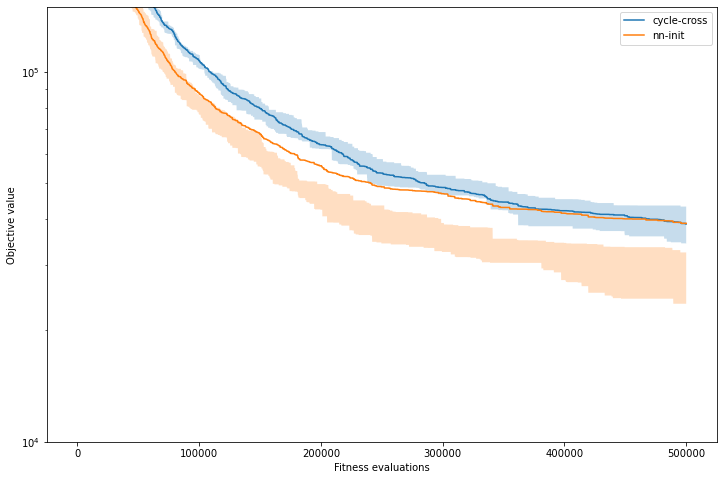

In [42]:
tsp.plot_experiments("cycle-cross", "nn-init")

In [ ]:
##

Error: Pip module debugpy is required for debugging cells. You will need to install it to debug cells.

### Generation - population tradeoff


In [98]:
evals = 1000000

for pop_size in [10, 30, 100, 300, 1000, 3000]:
    gen_size = evals // pop_size

    run_experiment(exp_id=f'pop-tradeoff-pop-{pop_size}-gen-size-{gen_size}', data_input='inputs/tsp_std.in', repeats=10, mut_max_len=10, mut_prob=0.6, cx_prob=0.8, max_gen=gen_size, pop_size=pop_size, fitness=fitness,  create_ind=generate_path_nn, cross=cycle_cross, mutate=hybridMutationRandom(mutate_set=[swap_mutate, slide_mut, two_opt_mut], weights=[1,1,1,]),  print_frequency=100)








680.85
   29000 277810.78 256727.28 236985.69
   30000 273154.76 256491.79 236985.69
    1000 591805.34 580154.74 570813.07
    2000 543976.67 528155.22 513651.80
    3000 498564.04 480207.65 470974.42
    4000 480715.53 456842.89 443238.81
    5000 488328.13 454815.90 433472.92
    6000 458694.12 434826.86 425926.34
    7000 436494.70 415314.54 407486.28
    8000 403737.77 378189.04 373617.61
    9000 410142.72 381485.30 365825.59
   10000 394956.75 368761.67 353965.56
   11000 377457.11 358869.86 347633.62
   12000 367484.43 346915.10 339877.89
   13000 379274.88 338066.05 322762.90
   14000 333286.16 320276.61 317611.32
   15000 326495.60 313244.79 307632.30
   16000 332662.46 314239.13 306561.22
   17000 334666.35 310083.80 299181.42
   18000 318967.01 296323.54 292414.80
   19000 338909.97 298810.56 291300.08
   20000 341902.72 302288.26 287016.63
   21000 306716.61 294524.07 286575.08
   22000 310466.33 278452.15 270823.34
   23000 308556.89 286544.71 269460.00
   24000 316097.12

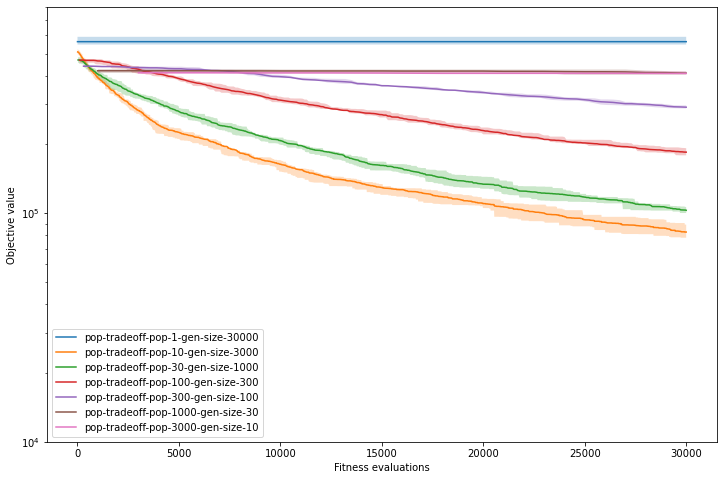

In [102]:
exps = []
importlib.reload(utils)
# for pop_size in [30, 100, 300, 1000 3000]:
for pop_size in [1, 10,  30, 100, 300, 1000, 3000]:
    gen_size = evals// pop_size
    exps.append(f'pop-tradeoff-pop-{pop_size}-gen-size-{gen_size}')

tsp.plot_experiments(*exps, ylim=[10000, 800000])

In [78]:
evals = 100000

for pop_size in [30, 100, 300, 1000, 3000]:
    gen_size = evals // pop_size

    run_experiment(exp_id=f'pop-tradeoff-edge-recomb-pop-{pop_size}-gen-size-{gen_size}', data_input='inputs/tsp_std.in', repeats=3, mut_max_len=10, mut_prob=0.6, cx_prob=0.8, max_gen=gen_size, pop_size=pop_size, fitness=fitness,  create_ind=generate_path_nn, cross=edge_recomb_cross, mutate=hybridMutationRandom(mutate_set=[swap_mutate, slide_mut, two_opt_mut], weights=[1,1,1,]),  print_frequency=100)


NameError: name 'edge_recomb' is not defined

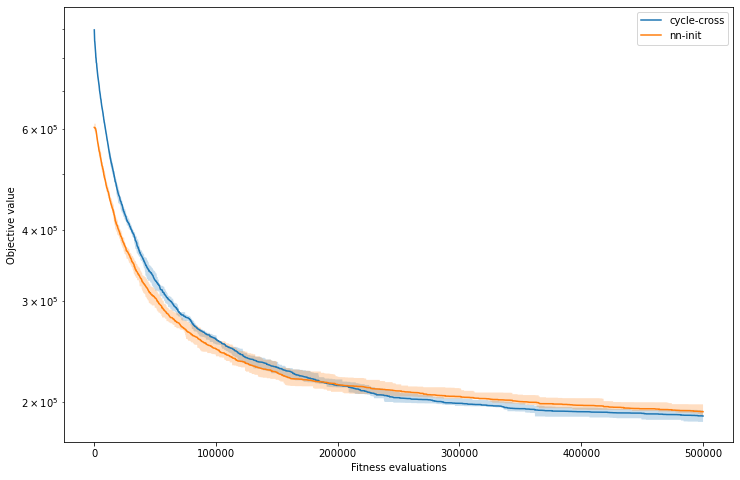

In [111]:
plot_experiments('cycle-cross', 'nn-init')

In [16]:
# run_experiment(exp_id=f'edge-recomb-mut-random-pop-30-gen-20000', data_input='inputs/tsp_std.in', repeats=1, mut_max_len=10, mut_prob=0.6, cx_prob=0.8, max_gen=20000, pop_size=30, fitness=fitness,  create_ind=generate_path_nn, cross=edge_recomb_cross, mutate=hybridMutationRandom(mutate_set=[swap_mutate, slide_mut, two_opt_mut], weights=[1,1,1,]),  print_frequency=10)

run_experiment(exp_id='hybrid-cross-best-mut-60-pop-200-gen-10000', data_input='inputs/tsp_std.in', repeats=1, mut_max_len=10, mut_prob=0.6, cx_prob=0.8, max_gen=10000, pop_size=200, fitness=fitness,  create_ind=create_random_perm, cross=hybridCrossoverBest(cross_set=cross_set), mutate=swap_mutate,  print_frequency=100)


   20000 469063.19 399768.50 358343.59
   40000 371218.86 321332.69 289290.95
   60000 367225.52 274001.26 242487.65
   80000 303406.55 252238.65 223806.41
  100000 341874.21 240031.85 209297.96
  120000 302861.93 228508.37 203063.97
  140000 283667.09 226802.55 198033.21
  160000 294722.51 216073.51 186635.74
  180000 284720.33 208752.49 182525.11
  200000 279665.23 206891.66 178925.93
  220000 314588.29 208262.18 178848.67
  240000 269053.99 204040.75 175251.06
  260000 254843.72 199736.53 173372.45
  280000 264848.59 201585.18 173348.06
  300000 290844.26 204908.09 173285.84
  320000 253777.28 198266.16 173285.84
  340000 253400.69 198711.97 172783.26
  360000 283683.69 199241.86 172783.26
  380000 254024.06 201316.53 169989.95
  400000 247533.62 192632.90 166935.72
  420000 263623.53 194467.17 166822.21
  440000 270282.61 195237.93 166822.21
  460000 241223.22 195094.95 166822.21
  480000 256501.85 193108.16 166822.21
  500000 316425.45 213840.41 166822.21
  520000 273544.40 198001

In [17]:
run_experiment(exp_id='hybrid-cross-best-mut-60-pop-400-gen-10000', data_input='inputs/tsp_std.in', repeats=1, mut_max_len=10, mut_prob=0.6, cx_prob=0.8, max_gen=10000, pop_size=400, fitness=fitness,  create_ind=create_random_perm, cross=hybridCrossoverBest(cross_set=cross_set), mutate=swap_mutate,  print_frequency=100)

   40000 493056.24 386345.39 341514.06
   80000 393639.68 302955.30 265862.45
  120000 371163.99 269644.32 227386.74
  160000 325147.52 239523.07 204375.70
  200000 273128.36 217711.78 186132.36
  240000 271476.52 204339.15 173382.37
  280000 272382.74 199401.06 169670.00
  320000 264380.35 197628.02 168321.42
  360000 267494.93 193389.40 167266.91
  400000 281814.15 193375.58 164829.86
  440000 269720.47 193902.70 164752.03
  480000 295683.32 194310.84 164578.23
  520000 292605.89 190905.67 163526.78
  560000 258360.43 191146.11 163526.78
  600000 256924.84 193998.63 163526.78
  640000 266103.15 190163.43 163526.78
  680000 317575.45 190546.66 162189.86
  720000 313448.22 187695.92 161955.30
  760000 245130.72 187277.59 161955.30
  800000 246921.10 188889.74 161955.30
  840000 253393.43 190458.07 161955.30
  880000 256567.09 190701.56 161955.30
  920000 264538.97 189549.53 161955.30
  960000 252781.72 189062.98 161955.30
 1000000 297141.66 193570.16 161955.30
 1040000 261422.65 190751

KeyboardInterrupt: 

In [15]:
run_experiment(exp_id='hybrid-cross-best-mut-60-pop-800-gen-5000', data_input='inputs/tsp_std.in', repeats=1, mut_max_len=10, mut_prob=0.6, cx_prob=0.8, max_gen=10000, pop_size=1600, fitness=fitness,  create_ind=create_random_perm, cross=hybridCrossoverBest(cross_set=cross_set), mutate=swap_mutate,  print_frequency=10)

5
 1088000 272546.65 194301.19 166212.15
 1104000 269957.19 193707.11 166212.15
 1120000 291916.61 193001.47 166212.15
 1136000 273100.47 192357.04 166212.15
 1152000 289913.74 195552.71 166212.15
 1168000 265860.23 194018.93 166212.15
 1184000 279754.94 193419.32 166212.15
 1200000 269210.21 193146.58 166212.15
 1216000 258822.26 192628.41 166212.15
 1232000 271215.15 193653.90 166212.15
 1248000 296529.57 194209.98 166212.15
 1264000 285451.05 192465.12 166212.15
 1280000 285772.72 194808.44 166212.15
 1296000 295518.52 194555.98 166212.15
 1312000 280237.71 194967.89 166212.15
 1328000 303216.65 195149.04 166212.15
 1344000 289813.77 194032.95 166212.15
 1360000 276091.04 193619.76 166212.15
 1376000 284100.42 195248.78 166212.15
 1392000 273557.10 194976.79 166212.15
 1408000 275218.74 192892.32 166212.15
 1424000 290782.75 192119.34 166212.15
 1440000 276594.94 190884.08 166212.15
 1456000 302159.59 193583.65 166212.15
 1472000 303164.82 195114.17 166212.15
 1488000 267058.44 1938

KeyboardInterrupt: 

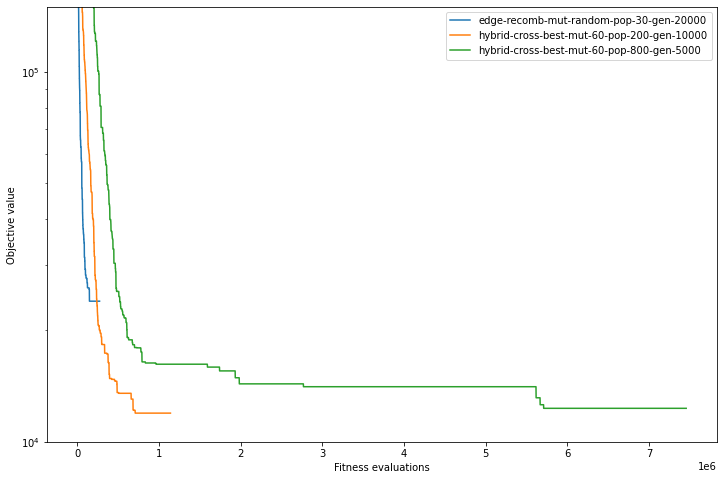

In [16]:
plot_experiments('edge-recomb-mut-random-pop-30-gen-20000', 'hybrid-cross-best-mut-60-pop-200-gen-10000', 'hybrid-cross-best-mut-60-pop-800-gen-5000')

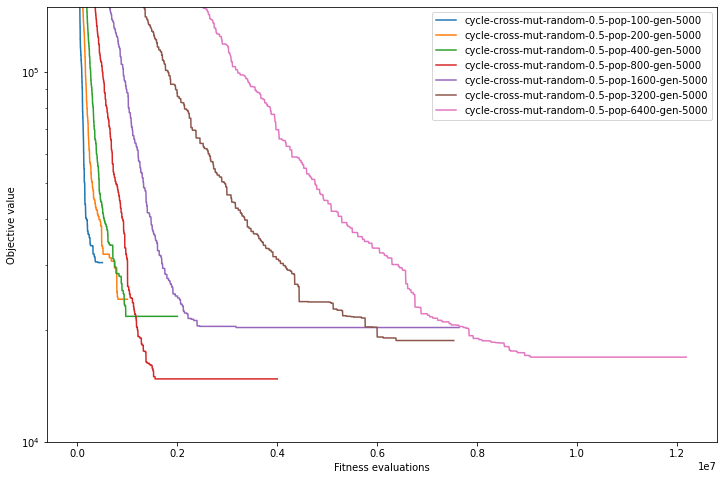

In [7]:
import tsp
exp = []
#exp = [f"hybrid-cross-best-mut-random-0.5-pop-{pop}-gen-5000" for pop in [100, 200, 400, 800, 1600, 3200, 6400, 12800]]
exp += [f"cycle-cross-mut-random-0.5-pop-{pop}-gen-5000" for pop in [100, 200, 400, 800, 1600, 3200, 6400]]
tsp.plot_experiments(*exp)

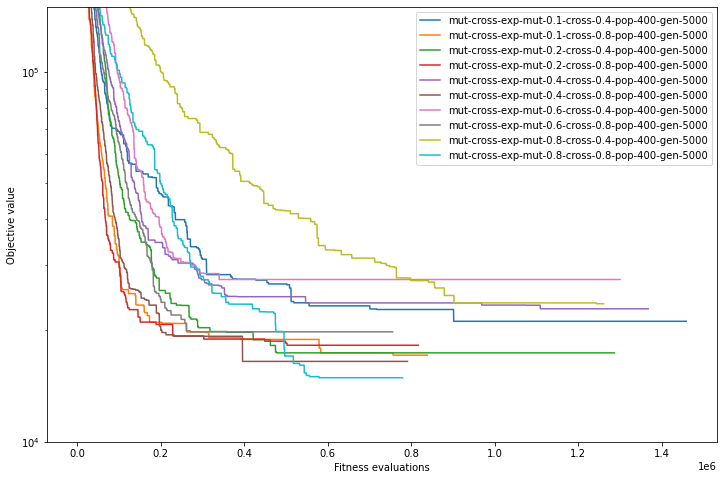

In [21]:
import tsp
exp = []
for mut in [0.1, 0.2, 0.4, 0.6, 0.8]:
    for cross in [0.4, 0.8]:
        exp.append(f"mut-cross-exp-mut-{mut}-cross-{cross}-pop-400-gen-5000")

tsp.plot_experiments(*exp)